In [5]:
import os
import cv2
import torch
from pathlib import Path
!pip install ultralytics
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/drive')
import numpy as np

Drive already mounted at /drive; to attempt to forcibly remount, call drive.mount("/drive", force_remount=True).


In [ ]:
import os, zipfile

zip_path = "/drive/MyDrive/Copia BD_LicensePlate.zip"
extract_path = "/drive/MyDrive/Copia_BD_LicensePlate"

if not os.path.exists(extract_path) or not os.listdir(extract_path):
    print("⏳ Descomprimiendo ZIP...")
    os.makedirs(extract_path, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("✅ Descomprimido en:", extract_path)
else:
    print("⚡ Ya estaba descomprimido en:", extract_path)

⚡ Ya estaba descomprimido en: /drive/MyDrive/Copia_BD_LicensePlate


In [6]:
import os
from pathlib import Path
import cv2
import numpy as np
import torch
from ultralytics import YOLO
import pytesseract
from google.colab.patches import cv2_imshow  # solo Colab

class LicensePlateDetector:
    def __init__(self):
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.model = None

    # ================= Dataset =================
    def create_dataset(self, dataset_path, yaml_path="dataset.yaml"):
        train_path = os.path.join(dataset_path, 'images', 'train')
        val_path = os.path.join(dataset_path, 'images', 'val')
        test_path = os.path.join(dataset_path, 'images', 'test')
        config_content = f"""
path: {dataset_path}
train: {train_path}
val: {val_path}
test: {test_path}
names:
  0: license_plate"""
        with open(yaml_path, 'w') as file:
            file.write(config_content)
        print(f"Dataset configuration file created at {yaml_path}")
        return yaml_path

    # ================= Entrenamiento =================
    def train_model(self, dataset_path, epochs=10, batch=8, project="license_plate_training"):
        yaml_path = self.create_dataset(dataset_path)
        print("Starting training...")
        self.model = YOLO("yolov8n.pt")
        results = self.model.train(data=yaml_path, epochs=epochs, batch=batch, project=project)
        best_model_path = Path(results.save_dir) / "weights" / "best.pt"
        print("Training completed")
        print(f"Best model saved at: {str(best_model_path)}")
        return str(best_model_path)

    # ================= Detección =================
    def detect_license_plate(self, best_model_path, test_dir, output_dir, conf=0.25):
        self.model = YOLO(best_model_path)
        prediction_results = self.model.predict(source=test_dir, save=False, conf=conf)
        results_dir = os.path.join(output_dir, "results")
        os.makedirs(results_dir, exist_ok=True)
        for i, result in enumerate(prediction_results):
            annotated_image = result.plot()
            output_path = os.path.join(results_dir, f"detected_{i}.jpg")
            cv2.imwrite(output_path, annotated_image)
        print("Detection completed. Results saved.")
        return prediction_results

    # ================= Segmentación =================
    def preprocess_plate_for_segmentation(self, plate_image):
        hsv = cv2.cvtColor(plate_image, cv2.COLOR_BGR2HSV)
        lower_blue = np.array([100, 150, 0])
        upper_blue = np.array([140, 255, 255])
        mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)
        gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
        gray[mask_blue > 0] = 255
        otsu_val, _ = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        _, binary = cv2.threshold(gray, max(0, otsu_val - 10), 255, cv2.THRESH_BINARY)
        binary = cv2.bitwise_not(binary)
        kernel = np.ones((3, 3), np.uint8)
        binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
        binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
        return binary

    def segment_characters(self, plate_image):
        preprocessed_plate = self.preprocess_plate_for_segmentation(plate_image)
        self.show_preprocessed_image(preprocessed_plate)
        contours, _ = cv2.findContours(preprocessed_plate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        characters = []
        h_plate, w_plate = preprocessed_plate.shape
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            aspect_ratio = w / h
            area = cv2.contourArea(contour)
            if x <= 2 or y <= 2 or x + w >= w_plate - 2 or y + h >= h_plate - 2:
                continue
            if area > 80 and 0.15 < aspect_ratio < 1.0 and h > 15 and w > 5:
                character_roi = plate_image[y:y+h, x:x+w]
                characters.append({'image': character_roi, 'bbox': (x, y, w, h)})
        characters.sort(key=lambda c: c['bbox'][0])
        return characters

    def show_preprocessed_image(self, image):
        cv2_imshow(image)

    def show_segmented_characters(self, characters, original_plate):
        output_image = original_plate.copy()
        for char_info in characters:
            x, y, w, h = char_info['bbox']
            cv2.rectangle(output_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2_imshow(output_image)

    # ================= OCR Robusto =================
    def preprocess_char_for_ocr(self, char_img):
        gray = cv2.cvtColor(char_img, cv2.COLOR_BGR2GRAY)
        # Binarización adaptativa
        thresh = cv2.adaptiveThreshold(
            gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY_INV, 31, 10
        )
        # Dilatación ligera
        kernel = np.ones((2, 2), np.uint8)
        thresh = cv2.dilate(thresh, kernel, iterations=1)
        # Redimensionar a tamaño estándar
        thresh = cv2.resize(thresh, (50, 50), interpolation=cv2.INTER_LINEAR)
        return thresh

    def recognize_characters(self, characters):
        plate_text = ""
        config = "--psm 10 --oem 3 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789"
        for idx, char_info in enumerate(characters):
            char_img = char_info['image']
            preprocessed = self.preprocess_char_for_ocr(char_img)
            text = pytesseract.image_to_string(preprocessed, config=config)
            text = "".join(filter(str.isalnum, text))
            # Correcciones para matrículas españolas
            if text.upper() == "I": text = "1"
            if text.upper() == "O": text = "0"
            plate_text += text.upper()
        return plate_text

    # ================= Procesar Resultados =================
    def process_and_show_results(self, prediction_results):
        for i, result in enumerate(prediction_results):
            image = result.orig_img
            boxes = result.boxes

            if boxes:
                print(f"\n--- Procesando Imagen {i+1} ---")
                for j, box in enumerate(boxes):
                    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                    plate_image = image[y1:y2, x1:x2]
                    if plate_image is not None and plate_image.size > 0:
                        print(f"  > Matrícula detectada en Bbox {x1, y1, x2, y2}")
                        characters = self.segment_characters(plate_image)
                        if characters:
                            self.show_segmented_characters(characters, plate_image)
                            plate_text = self.recognize_characters(characters)
                            print(f"  > Matrícula detectada de la imagen {i+1}: {plate_text}")
                        else:
                            print("  > No se encontraron caracteres tras segmentar.")
                    else:
                        print("  > No se pudo recortar la matrícula. Saltando.")
            else:
                print(f"\n--- Procesando Imagen {i+1} ---")
                print("  > No se detectó matrícula en esta imagen.")


Dataset configuration file created at dataset.yaml
Starting training...
Ultralytics 8.3.205 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train10, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mas

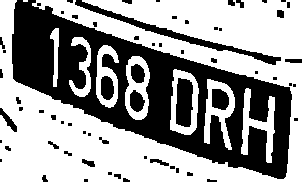

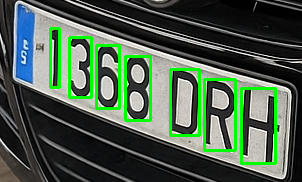

  > Matrícula detectada de la imagen 1: BH

--- Procesando Imagen 2 ---
  > Matrícula detectada en Bbox (871, 1057, 1699, 1424)


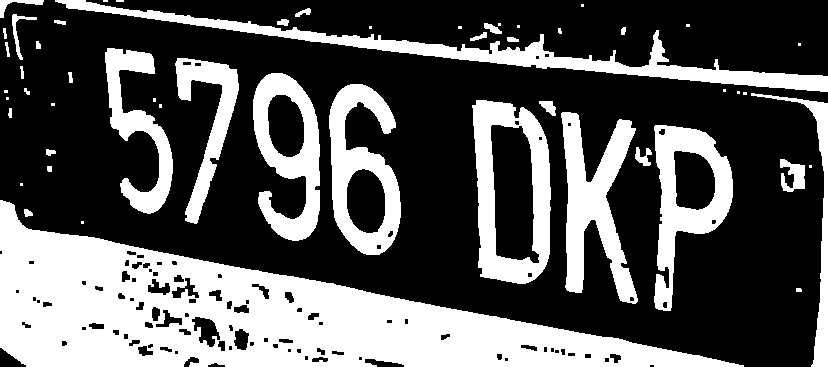

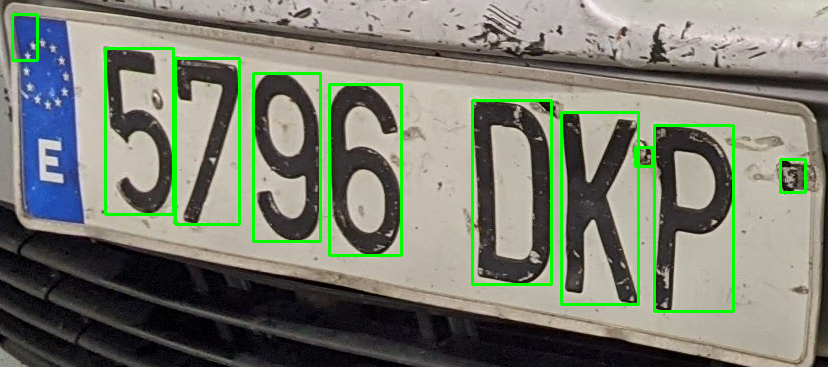

  > Matrícula detectada de la imagen 2: WS

--- Procesando Imagen 3 ---
  > Matrícula detectada en Bbox (1009, 870, 1763, 1223)


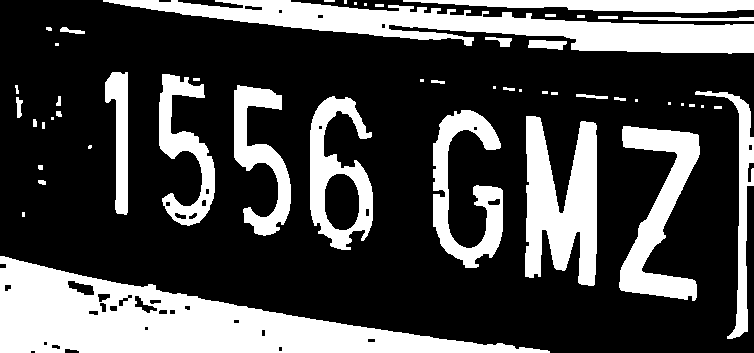

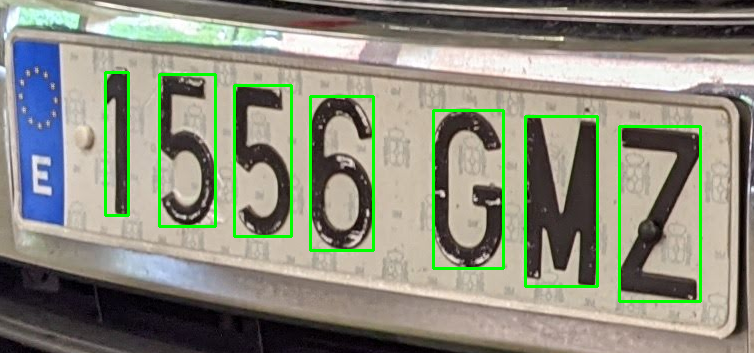

  > Matrícula detectada de la imagen 3: AYAPA

--- Procesando Imagen 4 ---
  > Matrícula detectada en Bbox (1074, 955, 1960, 1289)


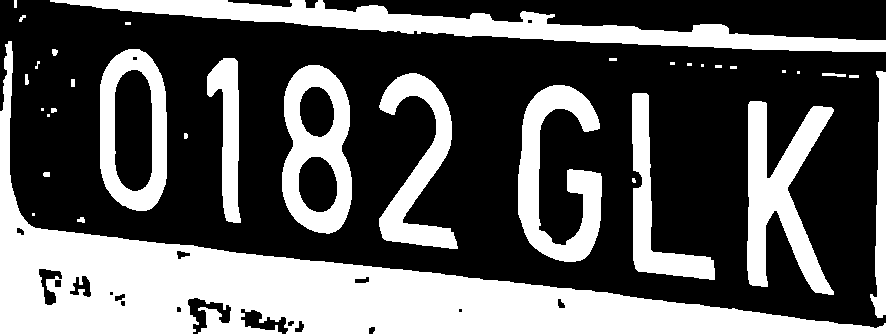

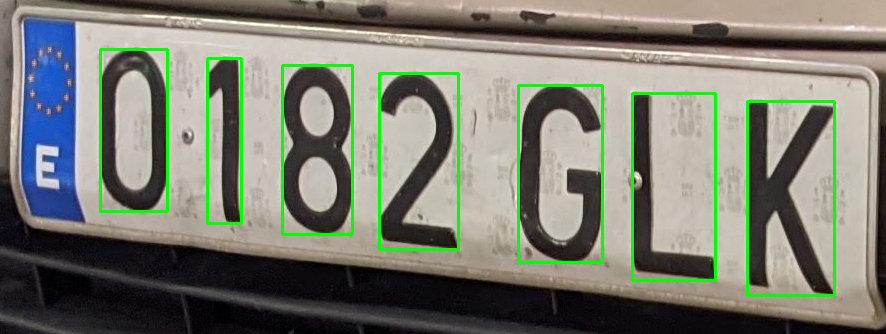

  > Matrícula detectada de la imagen 4: KRSFKG

--- Procesando Imagen 5 ---
  > Matrícula detectada en Bbox (1196, 709, 2004, 1032)


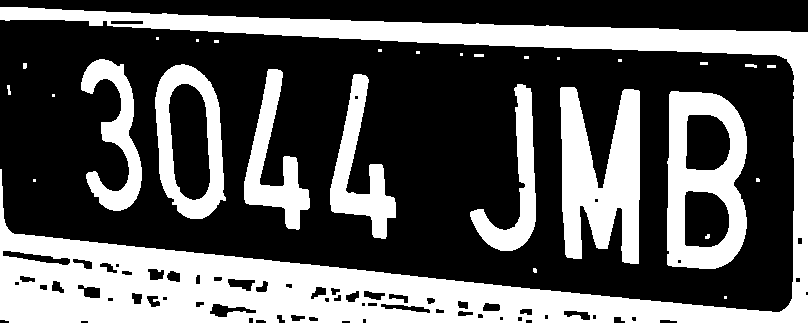

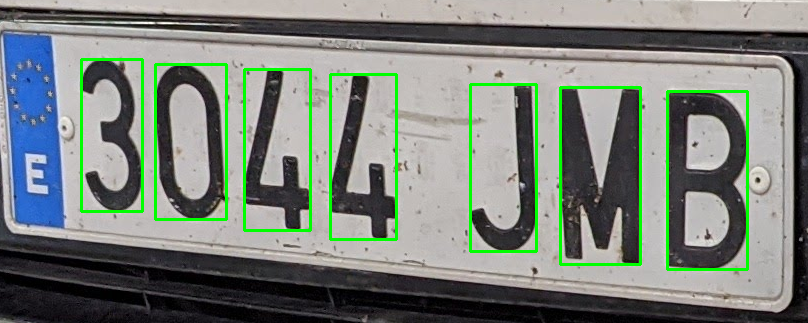

  > Matrícula detectada de la imagen 5: 387FEMYA2B

--- Procesando Imagen 6 ---
  > Matrícula detectada en Bbox (1099, 927, 1914, 1284)


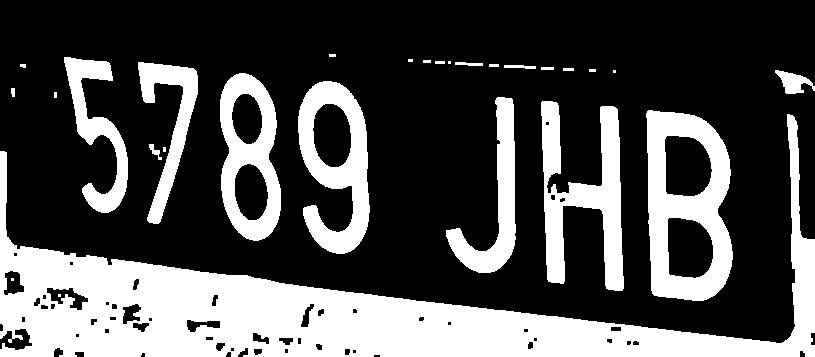

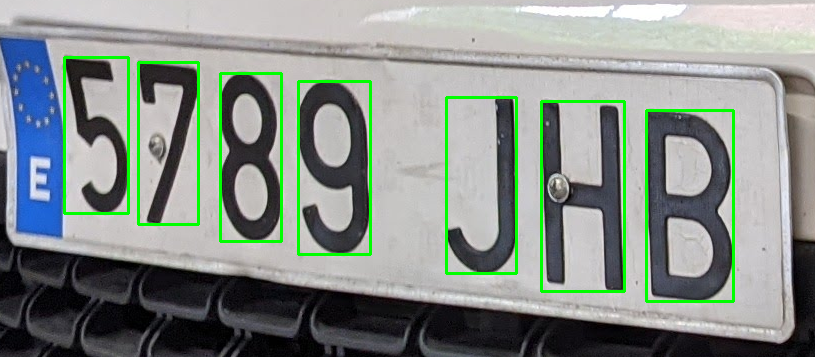

  > Matrícula detectada de la imagen 6: XS4ROQJS

--- Procesando Imagen 7 ---
  > Matrícula detectada en Bbox (521, 821, 1450, 1183)


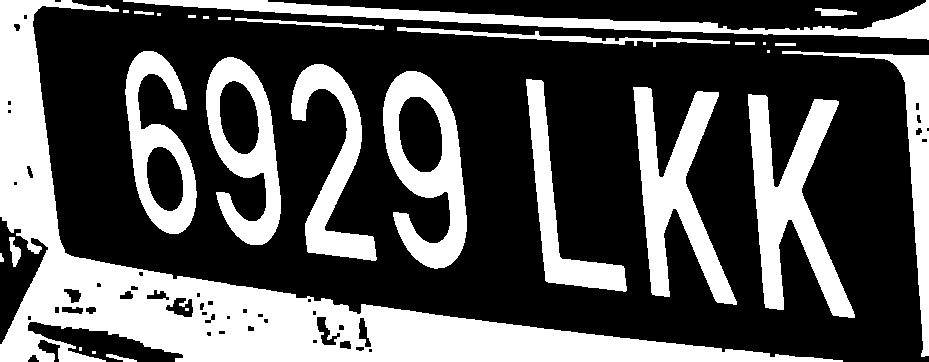

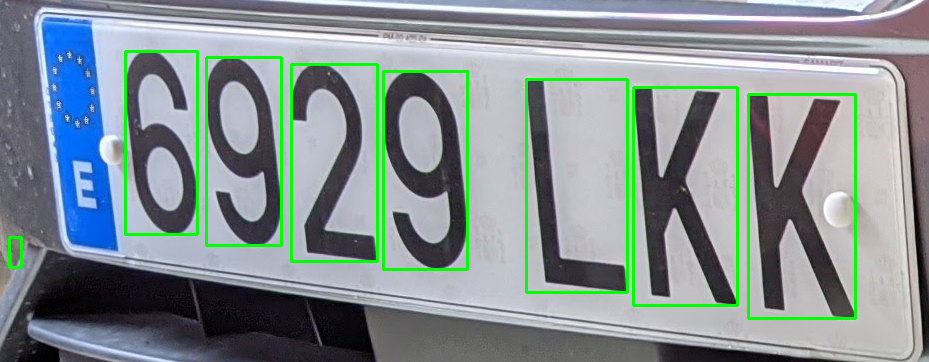

  > Matrícula detectada de la imagen 7: GEQPARZVK

--- Procesando Imagen 8 ---
  > Matrícula detectada en Bbox (856, 970, 1905, 1339)


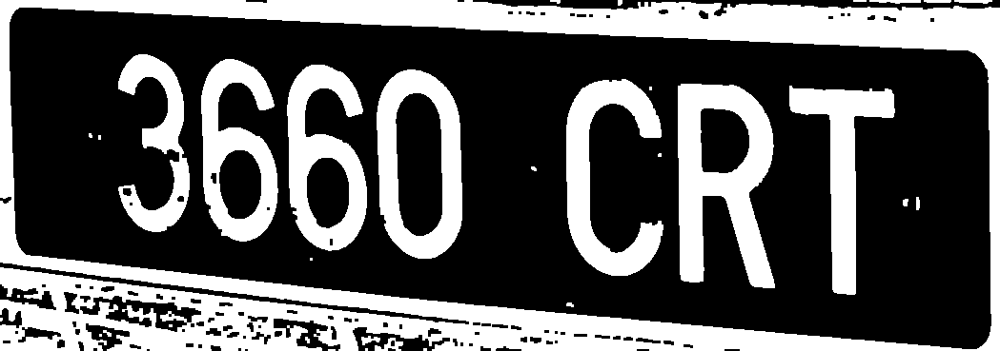

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 9 ---
  > Matrícula detectada en Bbox (580, 1069, 1658, 1457)


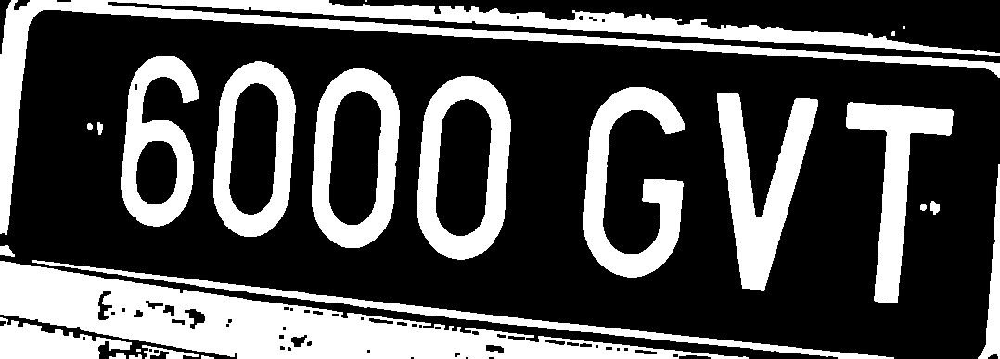

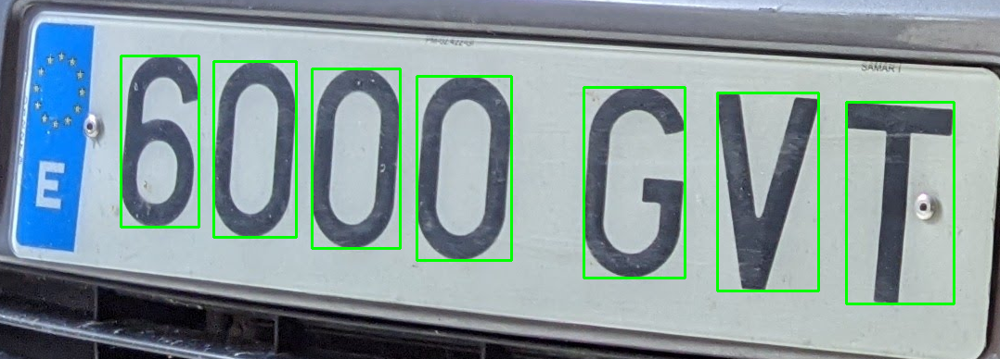

  > Matrícula detectada de la imagen 9: SS66COSSVV5

--- Procesando Imagen 10 ---
  > Matrícula detectada en Bbox (928, 764, 1898, 1161)


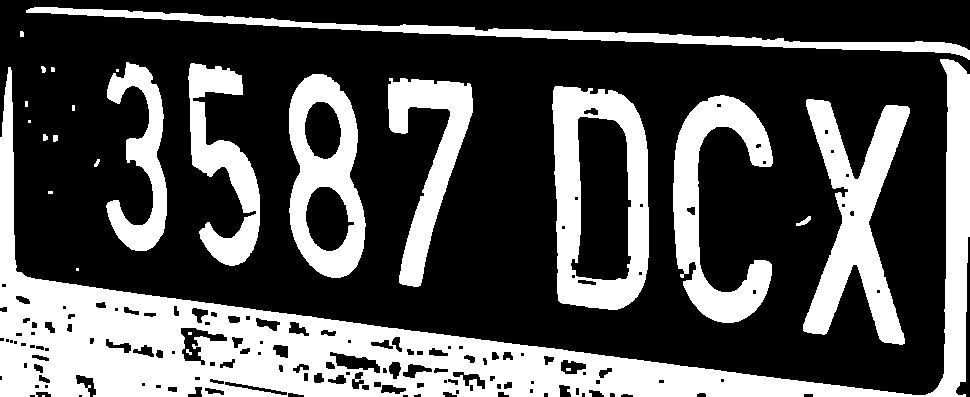

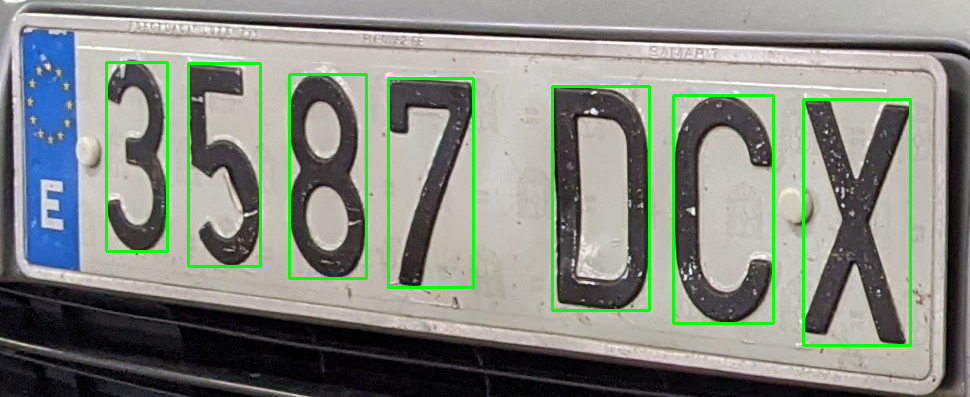

  > Matrícula detectada de la imagen 10: CES3TA4

--- Procesando Imagen 11 ---
  > Matrícula detectada en Bbox (832, 1023, 1721, 1389)


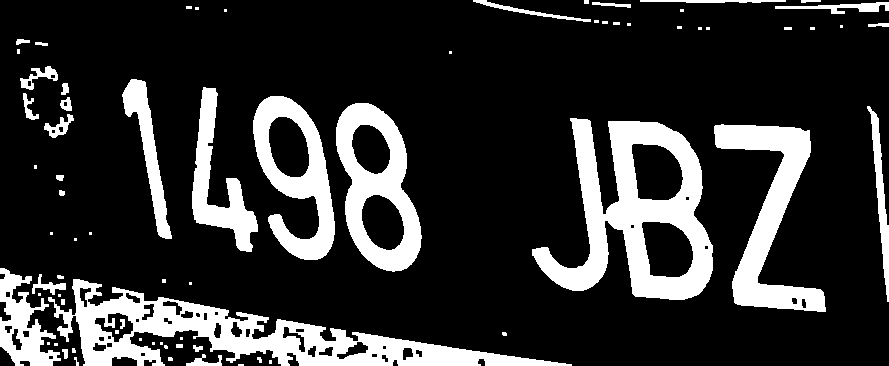

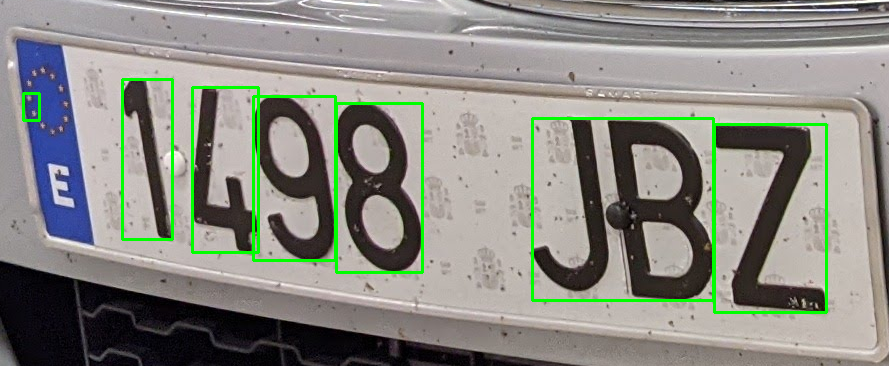

  > Matrícula detectada de la imagen 11: 1A3WE

--- Procesando Imagen 12 ---
  > Matrícula detectada en Bbox (1204, 851, 2027, 1146)


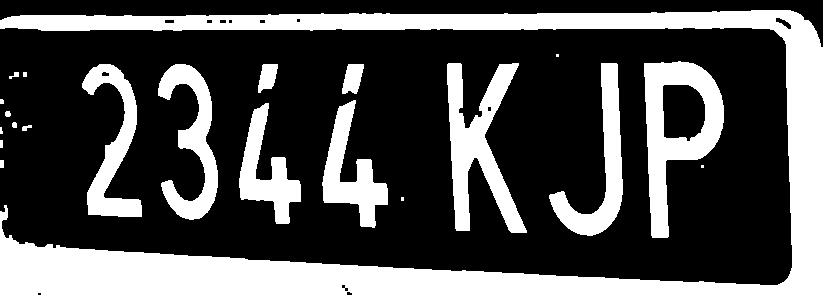

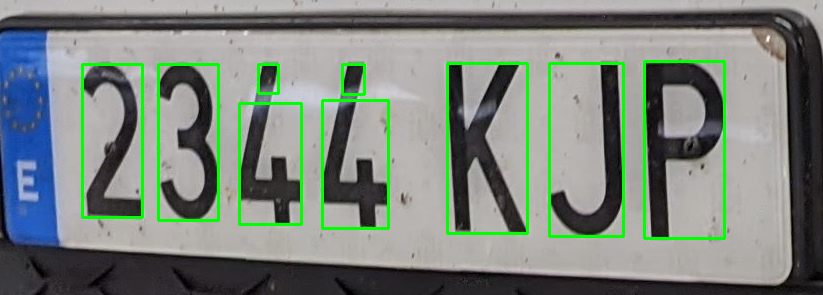

  > Matrícula detectada de la imagen 12: P3AF4JE

--- Procesando Imagen 13 ---
  > Matrícula detectada en Bbox (893, 1212, 1907, 1660)


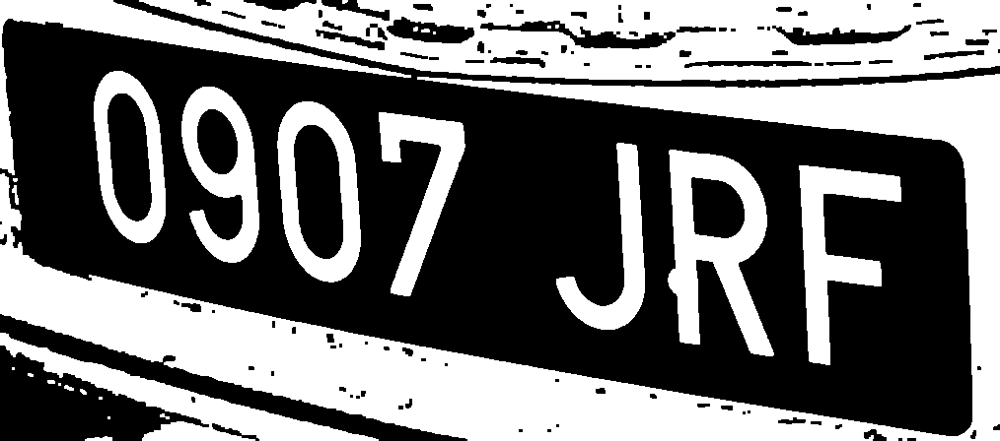

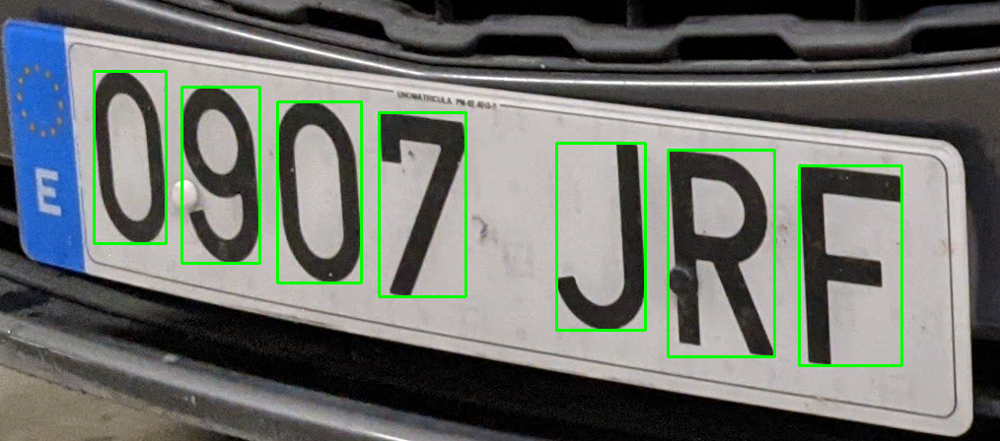

  > Matrícula detectada de la imagen 13: 864

--- Procesando Imagen 14 ---
  > Matrícula detectada en Bbox (607, 847, 1605, 1212)


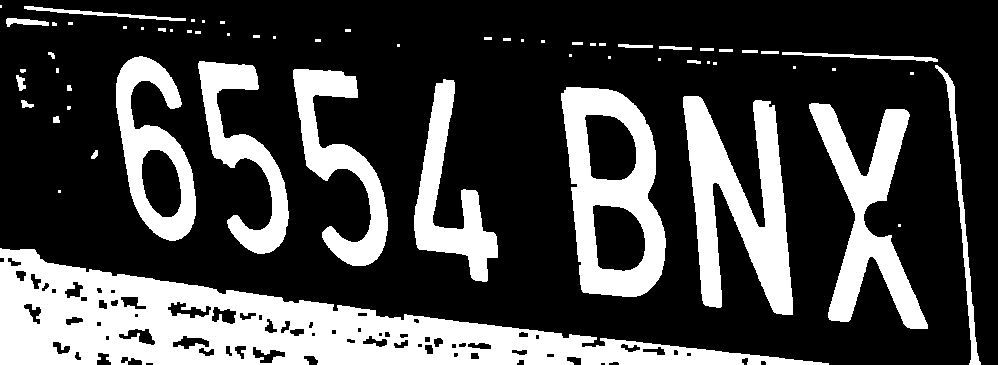

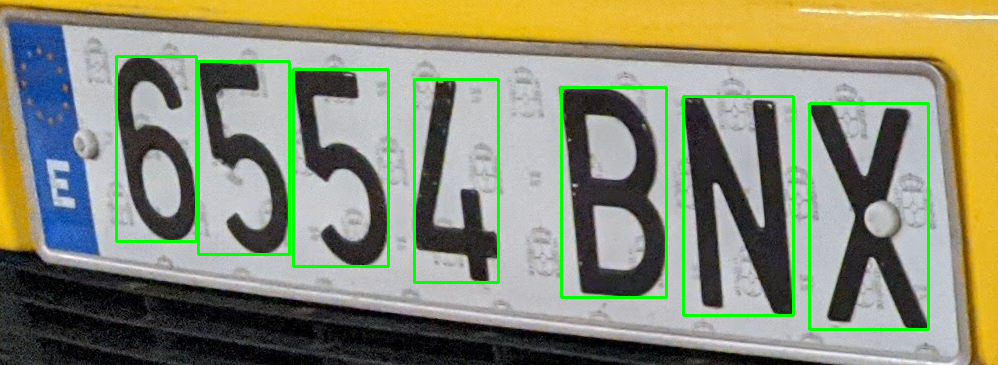

  > Matrícula detectada de la imagen 14: SLSYLKS2NI4

--- Procesando Imagen 15 ---
  > Matrícula detectada en Bbox (518, 1120, 1480, 1533)


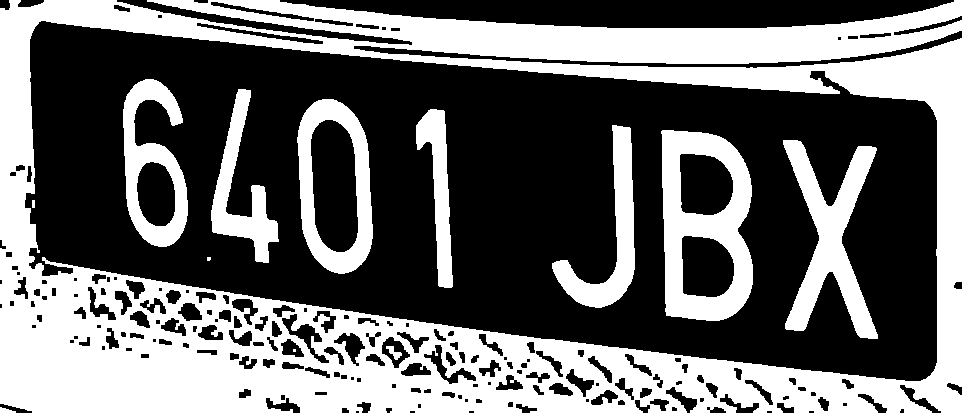

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 16 ---
  > Matrícula detectada en Bbox (1223, 1074, 1997, 1399)


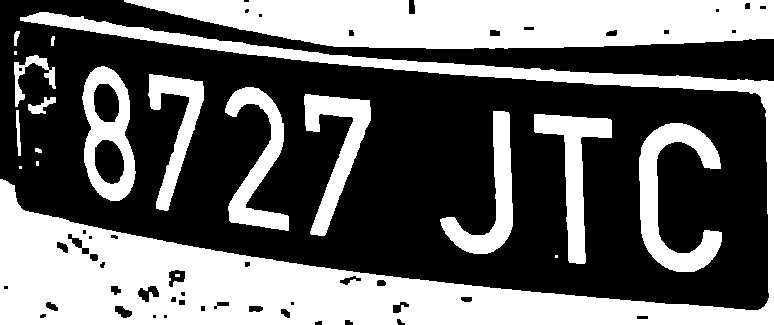

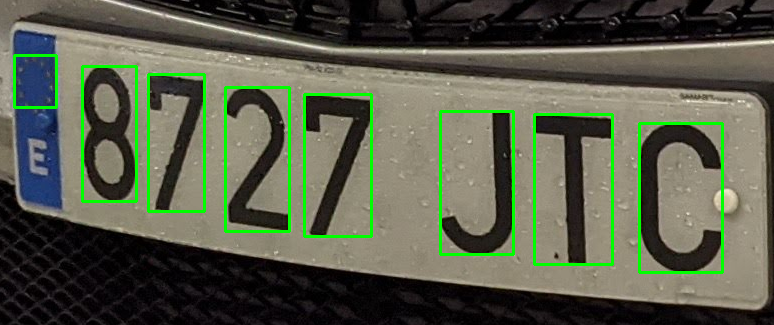

  > Matrícula detectada de la imagen 16: 3F4TA5

--- Procesando Imagen 17 ---
  > Matrícula detectada en Bbox (833, 981, 1728, 1223)


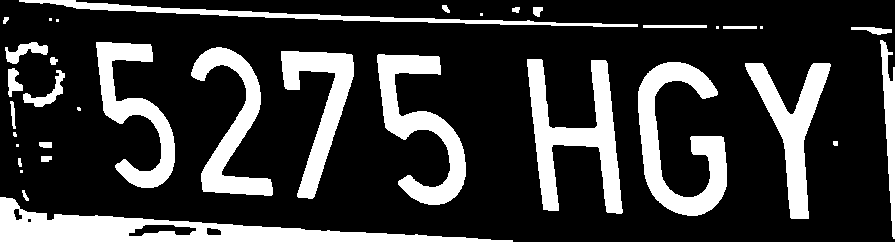

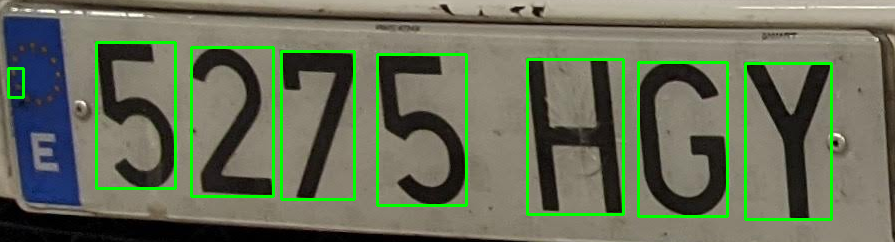

  > Matrícula detectada de la imagen 17: LP4VALLS4
  > Matrícula detectada en Bbox (806, 960, 1760, 1290)


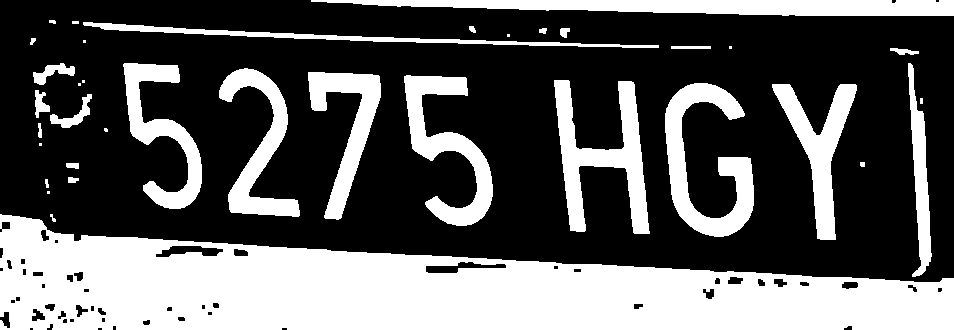

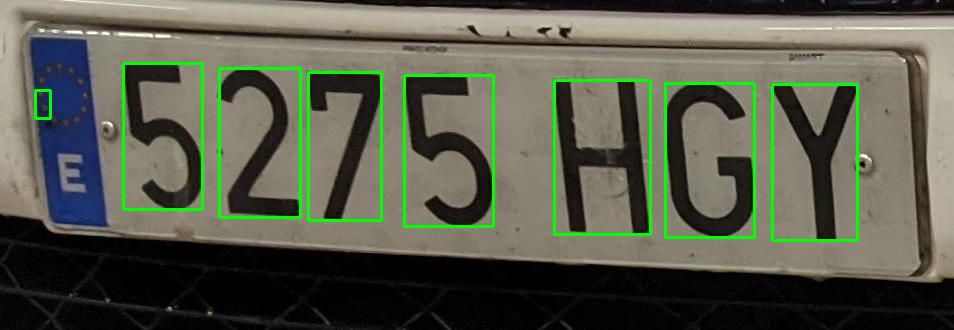

  > Matrícula detectada de la imagen 17: LPVALLS4

--- Procesando Imagen 18 ---
  > Matrícula detectada en Bbox (1393, 849, 2214, 1100)


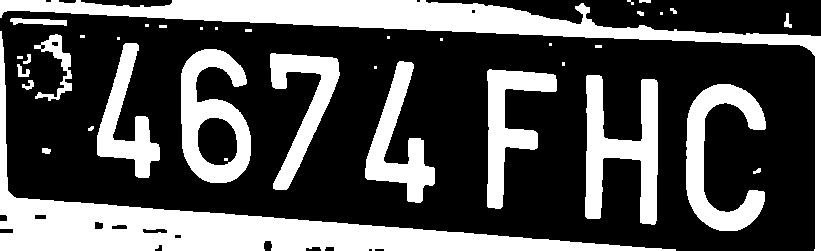

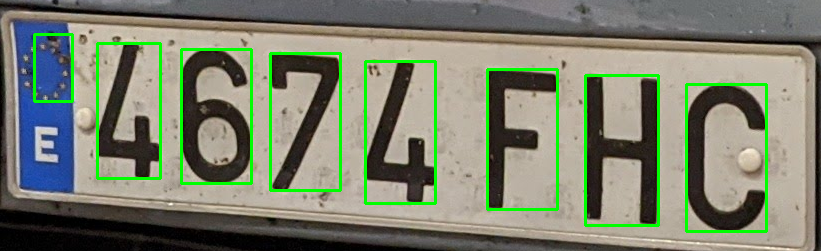

  > Matrícula detectada de la imagen 18: S

--- Procesando Imagen 19 ---
  > Matrícula detectada en Bbox (451, 548, 815, 709)


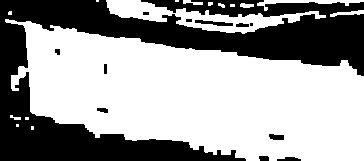

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 20 ---
  > Matrícula detectada en Bbox (883, 426, 1180, 593)


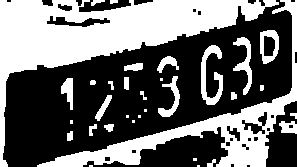

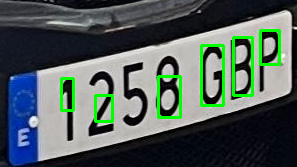

  > Matrícula detectada de la imagen 20: 44BP

--- Procesando Imagen 21 ---
  > Matrícula detectada en Bbox (276, 206, 613, 351)


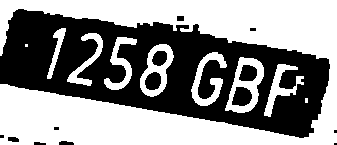

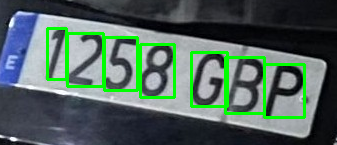

  > Matrícula detectada de la imagen 21: 4Y5SIG2PP

--- Procesando Imagen 22 ---
  > No se detectó matrícula en esta imagen.

--- Procesando Imagen 23 ---
  > Matrícula detectada en Bbox (335, 763, 911, 890)


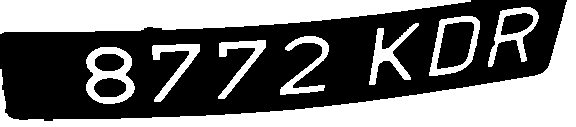

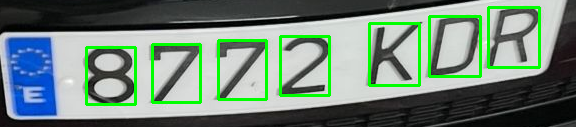

  > Matrícula detectada de la imagen 23: SW4WATFDEY

--- Procesando Imagen 24 ---
  > Matrícula detectada en Bbox (390, 786, 916, 986)


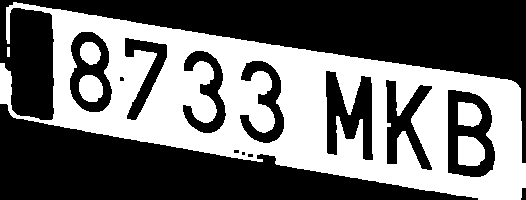

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 25 ---
  > Matrícula detectada en Bbox (647, 217, 861, 296)


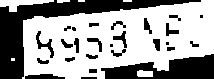

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 26 ---
  > Matrícula detectada en Bbox (1067, 417, 1198, 558)


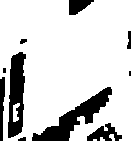

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 27 ---
  > Matrícula detectada en Bbox (262, 0, 385, 134)


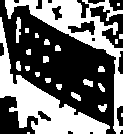

  > No se encontraron caracteres tras segmentar.
  > Matrícula detectada en Bbox (701, 826, 1024, 1223)


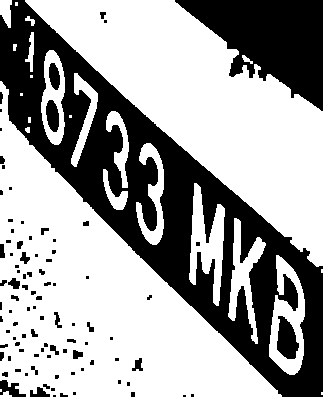

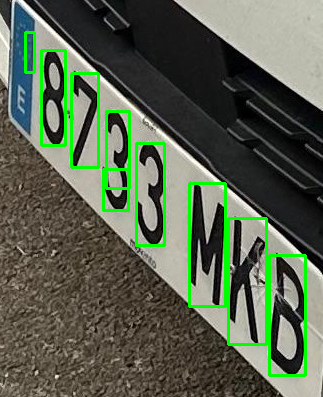

  > Matrícula detectada de la imagen 27: S40AYA
  > Matrícula detectada en Bbox (766, 909, 1031, 1218)


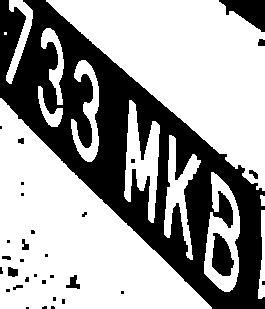

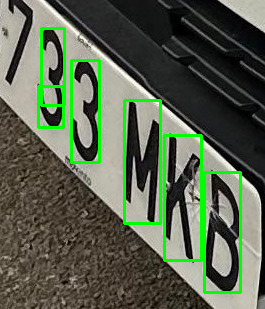

  > Matrícula detectada de la imagen 27: 0AY

--- Procesando Imagen 28 ---
  > Matrícula detectada en Bbox (292, 465, 470, 590)


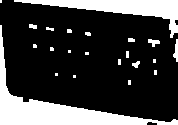

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 29 ---
  > Matrícula detectada en Bbox (290, 606, 558, 762)


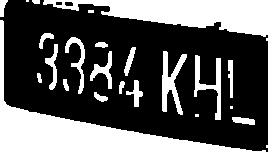

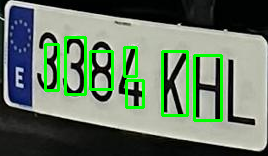

  > Matrícula detectada de la imagen 29: 2F4FK

--- Procesando Imagen 30 ---
  > Matrícula detectada en Bbox (786, 399, 1106, 566)


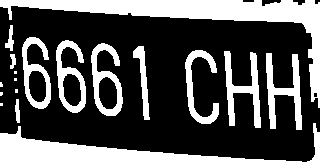

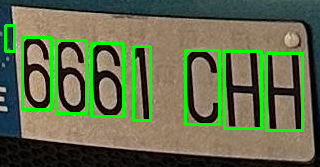

  > Matrícula detectada de la imagen 30: BSSS14

--- Procesando Imagen 31 ---
  > Matrícula detectada en Bbox (1355, 569, 1651, 804)


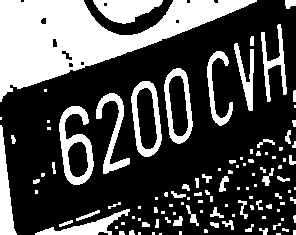

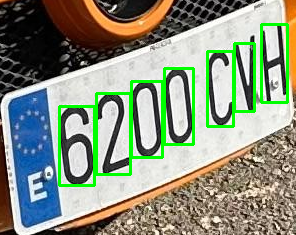

  > Matrícula detectada de la imagen 31: GSWA4C

--- Procesando Imagen 32 ---
  > Matrícula detectada en Bbox (736, 491, 1210, 643)


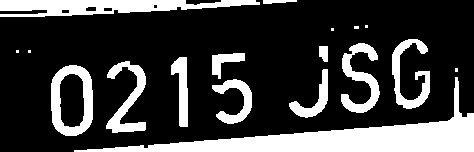

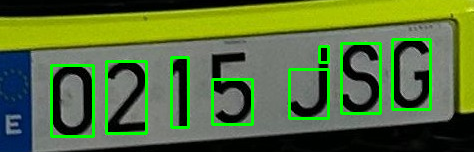

  > Matrícula detectada de la imagen 32: JS5

--- Procesando Imagen 33 ---
  > Matrícula detectada en Bbox (1628, 696, 1966, 934)


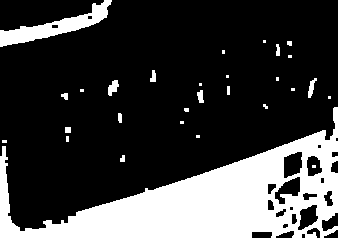

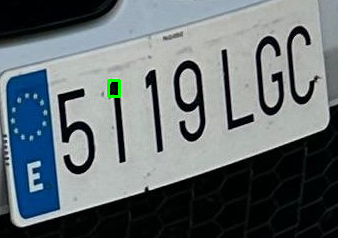

  > Matrícula detectada de la imagen 33: 

--- Procesando Imagen 34 ---
  > Matrícula detectada en Bbox (1356, 533, 1590, 691)


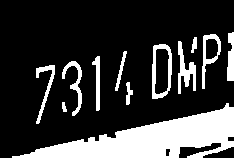

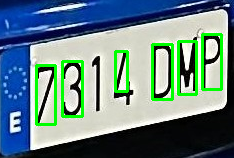

  > Matrícula detectada de la imagen 34: 3BA

--- Procesando Imagen 35 ---
  > Matrícula detectada en Bbox (599, 884, 978, 1099)


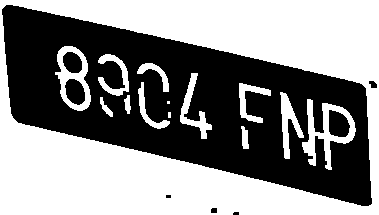

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 36 ---
  > Matrícula detectada en Bbox (1691, 516, 1976, 710)


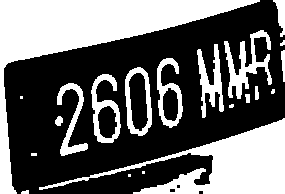

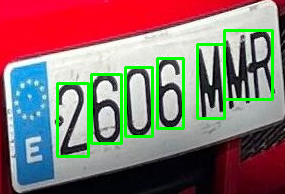

  > Matrícula detectada de la imagen 36: IA8NNY

--- Procesando Imagen 37 ---
  > Matrícula detectada en Bbox (1408, 449, 1793, 622)


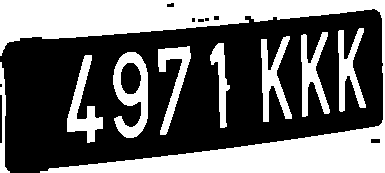

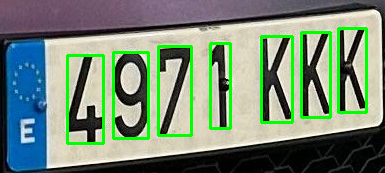

  > Matrícula detectada de la imagen 37: LSF444KK

--- Procesando Imagen 38 ---
  > Matrícula detectada en Bbox (1642, 519, 2070, 718)


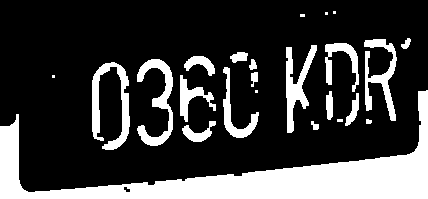

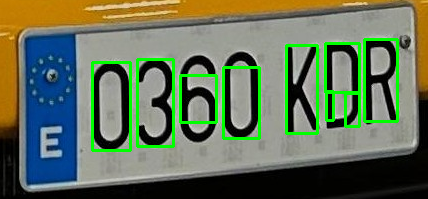

  > Matrícula detectada de la imagen 38: 8382

--- Procesando Imagen 39 ---
  > Matrícula detectada en Bbox (1389, 927, 1999, 1199)


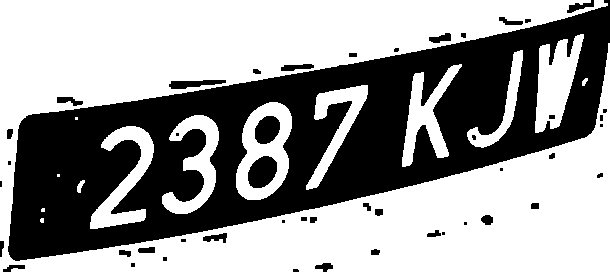

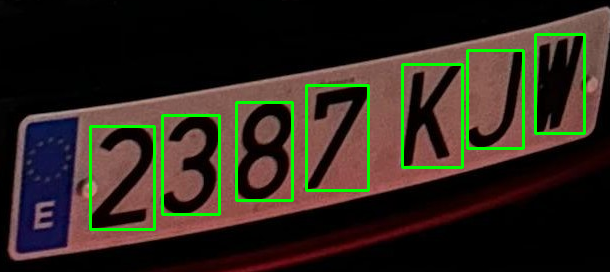

  > Matrícula detectada de la imagen 39: FSWAZI7

--- Procesando Imagen 40 ---
  > Matrícula detectada en Bbox (1253, 767, 1593, 980)


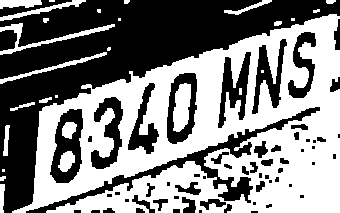

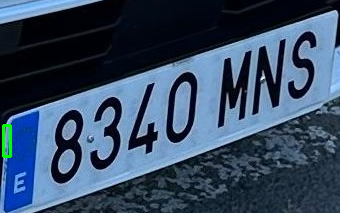

  > Matrícula detectada de la imagen 40: 

--- Procesando Imagen 41 ---
  > Matrícula detectada en Bbox (172, 633, 609, 904)


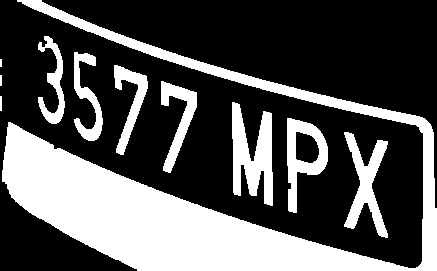

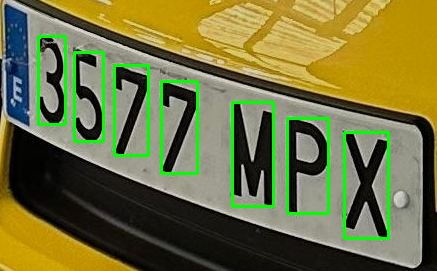

  > Matrícula detectada de la imagen 41: V4V4M4

--- Procesando Imagen 42 ---
  > Matrícula detectada en Bbox (110, 272, 289, 373)


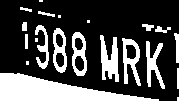

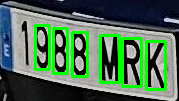

  > Matrícula detectada de la imagen 42: SFRR14

--- Procesando Imagen 43 ---
  > Matrícula detectada en Bbox (1592, 920, 1838, 1138)


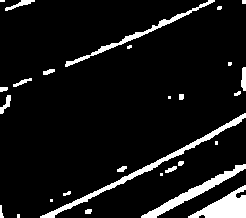

  > No se encontraron caracteres tras segmentar.

--- Procesando Imagen 44 ---
  > Matrícula detectada en Bbox (353, 715, 740, 957)


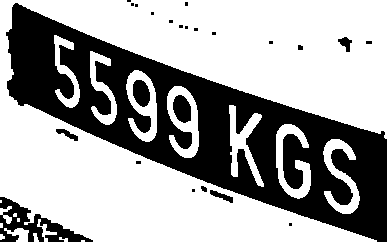

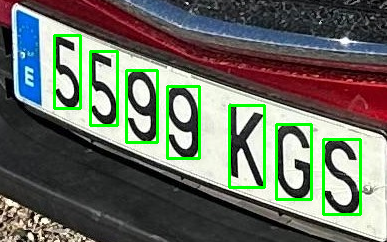

  > Matrícula detectada de la imagen 44: SSG4SSS

--- Procesando Imagen 45 ---
  > Matrícula detectada en Bbox (972, 304, 1289, 423)


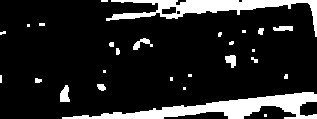

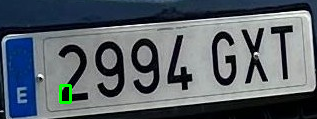

  > Matrícula detectada de la imagen 45: 

--- Procesando Imagen 46 ---
  > Matrícula detectada en Bbox (334, 497, 691, 658)


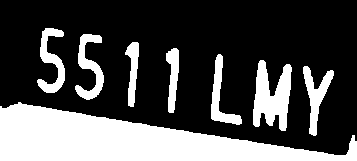

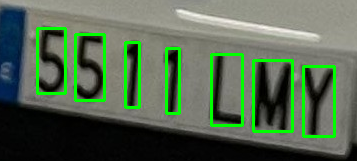

  > Matrícula detectada de la imagen 46: SLFMY

--- Procesando Imagen 47 ---
  > Matrícula detectada en Bbox (473, 1393, 917, 1761)


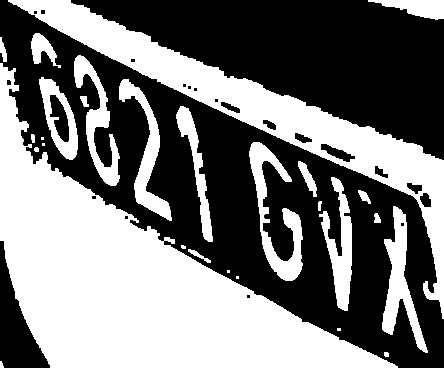

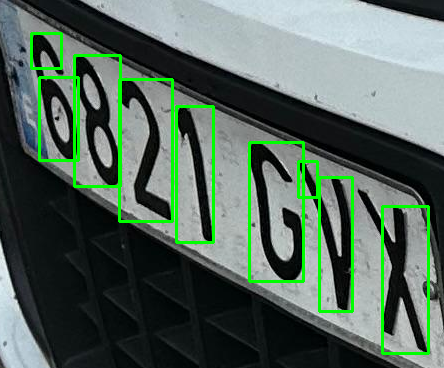

  > Matrícula detectada de la imagen 47: ANAS2YES

--- Procesando Imagen 48 ---
  > Matrícula detectada en Bbox (2371, 1477, 3153, 1933)


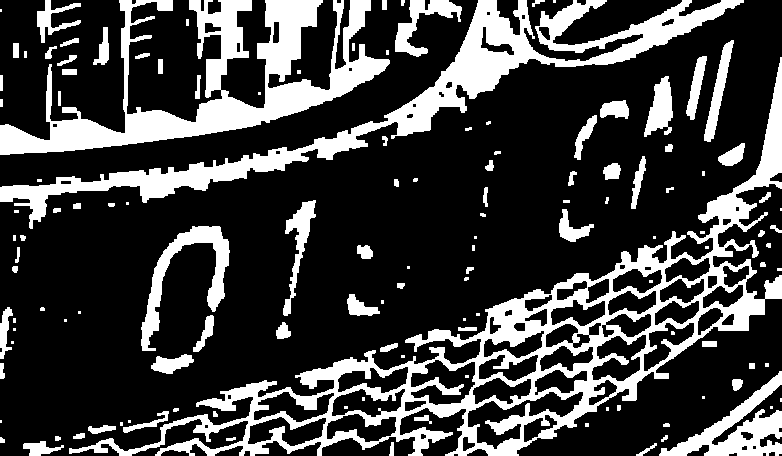

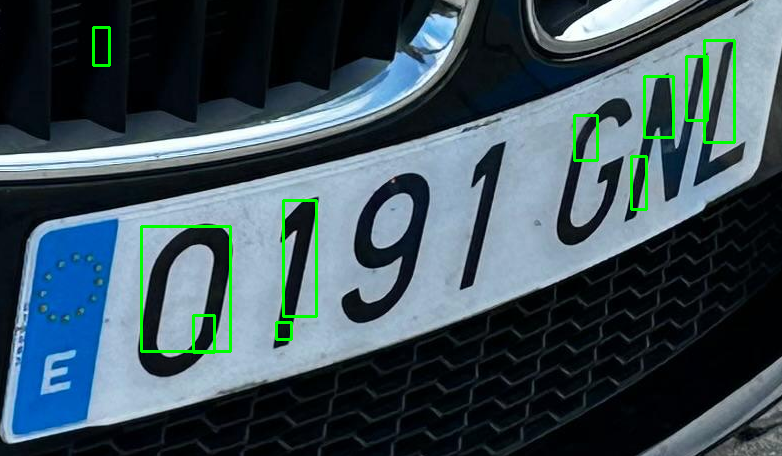

  > Matrícula detectada de la imagen 48: A44PAIA

--- Procesando Imagen 49 ---
  > Matrícula detectada en Bbox (1933, 1139, 2657, 1527)


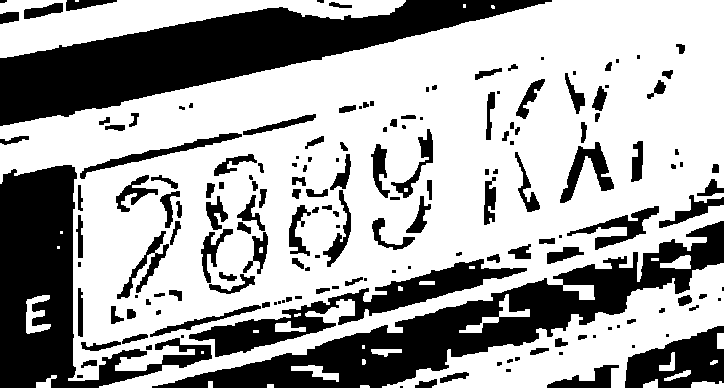

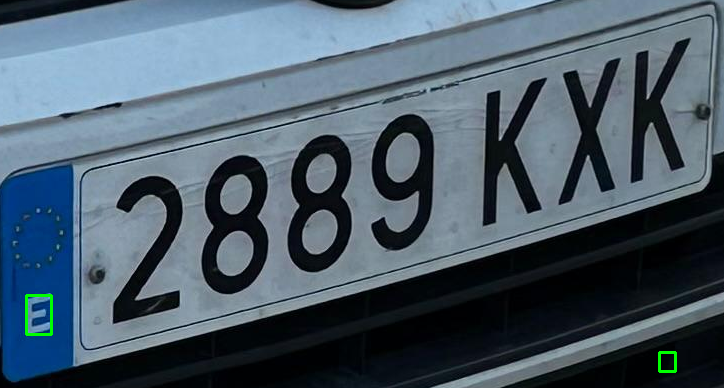

  > Matrícula detectada de la imagen 49: Z


In [7]:
# ================= MAIN EXECUTION =================
dataset_path = "/drive/MyDrive/BD_LicensePlate"
test_dir = "/drive/MyDrive/BD_LicensePlate/images/test"
output_dir = "/content/test_results"
detector = LicensePlateDetector()
best_model_path = detector.train_model(dataset_path, epochs=10, batch=8)
prediction_results = detector.detect_license_plate(best_model_path, test_dir, output_dir, conf=0.25)
detector.process_and_show_results(prediction_results)